## Import Packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import TensorBoard


## Load Data

In [ ]:
import os
from sklearn.model_selection import train_test_split

base_folder = '/content/drive/MyDrive/document_processing/new_data'
class_folders = os.listdir(base_folder)
all_images = []
all_labels = []

for i ,class_folder in enumerate(class_folders):
    class_path = os.path.join(base_folder, class_folder)
    class_images = os.listdir(class_path)
    class_labels = [i] * len(class_images)
    all_images.extend([os.path.join(class_path, image) for image in class_images])
    all_labels.extend(class_labels)

train_images, valid_images, train_labels, valid_labels = train_test_split(
    all_images, all_labels, test_size=0.15, stratify=all_labels, random_state=42)


In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
validation_dataset = tf.data.Dataset.from_tensor_slices((valid_images, valid_labels))

image_height, image_width = 612 ,612


data_transform = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(image_height, image_width),
    tf.keras.layers.experimental.preprocessing.CenterCrop(image_height, image_width),
    tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.05),
    # tf.keras.layers.experimental.preprocessing.RandomShear(factor=0.02),
])




def load_and_preprocess_image(image_path, label):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, expand_animations = False)
    image = data_transform(image)
    image = tf.cast(image, tf.float32)
    image = (image/127.5) - 1

    return image, label

train_dataset = train_dataset.map(load_and_preprocess_image)
validation_dataset = validation_dataset.map(load_and_preprocess_image)




## Data preprocessing

### Data download

Show images and labels from the training set:

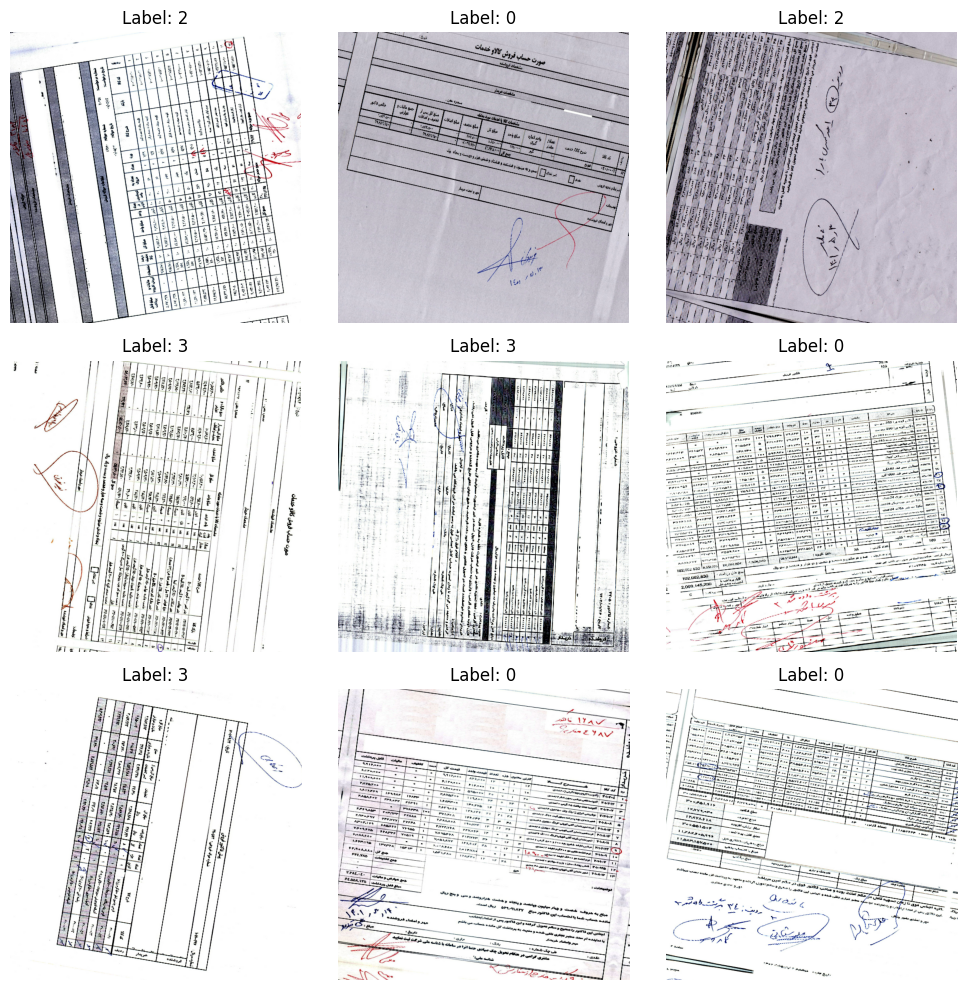

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

num_rows, num_cols = 3, 3
num_samples_to_display = num_rows * num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

for i, (image, label) in enumerate(train_dataset.take(num_samples_to_display)):
    # plt.imshow(image.numpy())
    # break
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    ax.imshow(image.numpy() ,cmap = 'gray')
    ax.set_title(f'Label: {label.numpy()}')
    ax.axis('off')

plt.tight_layout()
plt.show()


Apply this function to each item in the dataset using the map method:

In [ ]:
label2name = {0:'down2up', 1:'up2down' ,2:'right2left',3:'left2right'}

In [ ]:
# Shuffle and batch your datasets
batch_size = 32

train_batches = train_dataset.shuffle(buffer_size=len(train_images)).batch(batch_size)
validation_batches = validation_dataset.batch(batch_size)

Now shuffle and batch the data.

Inspect a batch of data:

In [ ]:
for image_batch, label_batch in train_batches:
   break

image_batch.shape

TensorShape([32, 612, 612, 3])

## Create the base model from the pre-trained convnets


In [ ]:
IMG_SIZE = 612
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

9406464/9406464 [==============================] - 0s 0us/step


This feature extractor converts each `160x160x3` image into a `5x5x1280` block of features. See what it does to the example batch of images:

In [ ]:
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 20, 20, 1280)


## Feature extraction


### Freeze the convolutional base



In [ ]:
base_model.trainable = False

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 612, 612, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 306, 306, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 306, 306, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 306, 306, 32)         0         ['bn_Conv1[

### Add a classification head

To generate predictions from the block of features, average over the spatial `5x5` spatial locations, using a `tf.keras.layers.GlobalAveragePooling2D` layer to convert the features to  a single 1280-element vector per image.

In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [ ]:
num_classes = 4
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')

prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 4)


In [ ]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])

### Compile the model



In [ ]:
from tensorflow.keras.callbacks import EarlyStopping



base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])



log_dir = "/content/drive/MyDrive/document_processing/models/MobileNet-tune/logs"

early_stop = EarlyStopping(monitor='val_loss', patience=8, verbose=1, restore_best_weights=True)

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
checkpoint_callback = ModelCheckpoint('/content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 20, 20, 1280)      2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 4)                 5124      
                                                                 
Total params: 2263108 (8.63 MB)
Trainable params: 5124 (20.02 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
len(model.trainable_variables)

2

### Train the model



In [ ]:
import math
initial_epochs = 60
validation_steps= math.ceil(len(valid_images) / batch_size)


loss0,accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

4/4 [==============================] - 52s 11s/step - loss: 1.4329 - accuracy: 0.2377


In [ ]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 1.43
initial accuracy: 0.24


In [ ]:
history = model.fit(train_batches,
                    epochs=initial_epochs,
                    validation_data=validation_batches,
                    callbacks=[checkpoint_callback, tensorboard_callback])

Epoch 1/60
22/22 [==============================] - ETA: 0s - loss: 1.3656 - accuracy: 0.3449
Epoch 1: val_loss improved from inf to 1.35223, saving model to /content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


22/22 [==============================] - 129s 1s/step - loss: 1.3656 - accuracy: 0.3449 - val_loss: 1.3522 - val_accuracy: 0.3852
Epoch 2/60
22/22 [==============================] - ETA: 0s - loss: 1.3180 - accuracy: 0.3754
Epoch 2: val_loss improved from 1.35223 to 1.30306, saving model to /content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5
22/22 [==============================] - 127s 1s/step - loss: 1.3180 - accuracy: 0.3754 - val_loss: 1.3031 - val_accuracy: 0.4262
Epoch 3/60
22/22 [==============================] - ETA: 0s - loss: 1.2706 - accuracy: 0.4290
Epoch 3: val_loss improved from 1.30306 to 1.28099, saving model to /content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5
22/22 [==============================] - 124s 1s/step - loss: 1.2706 - accuracy: 0.4290 - val_loss: 1.2810 - val_accuracy: 0.4344
Epoch 4/60
22/22 [==============================] - ETA: 0s - loss: 1.2395 - accuracy: 0.4667
Epoch 4: val

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/document_processing/models/MobileNet-tune/logs


<IPython.core.display.Javascript object>

### Learning curves



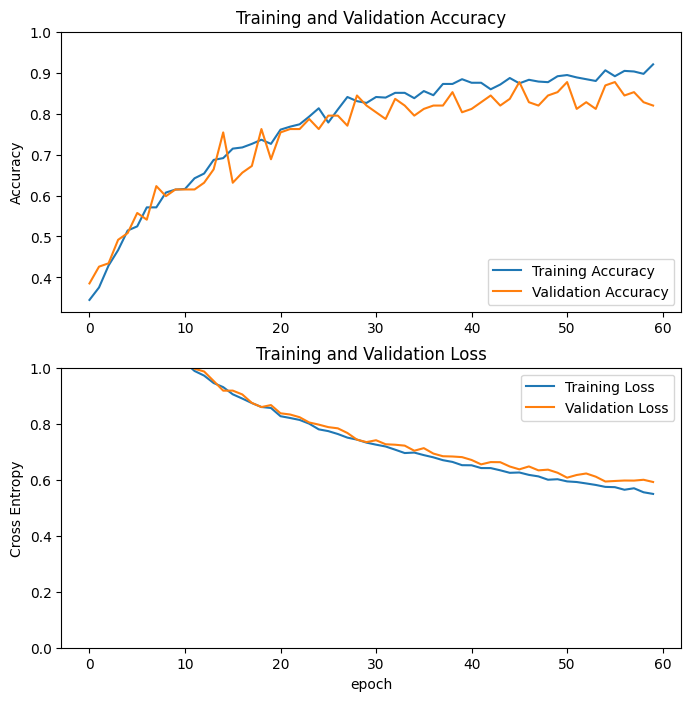

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Fine tuning


### Un-freeze the top layers of the model


In [ ]:
base_model.trainable = True

In [ ]:
print("Number of layers in the base model: ", len(base_model.layers))

fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  154


### Compile the model



In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 20, 20, 1280)      2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 4)                 5124      
                                                                 
Total params: 2263108 (8.63 MB)
Trainable params: 1866564 (7.12 MB)
Non-trainable params: 396544 (1.51 MB)
_________________________________________________________________


In [ ]:
len(model.trainable_variables)

56

### Continue training the model

In [ ]:
fine_tune_epochs = 15
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_batches,
                         epochs=total_epochs,
                         initial_epoch =  history.epoch[-1],
                         validation_data=validation_batches,
                         callbacks=[checkpoint_callback, tensorboard_callback,early_stop])

Epoch 60/75
22/22 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8275
Epoch 60: val_loss did not improve from 0.59188
22/22 [==============================] - 139s 2s/step - loss: 0.4248 - accuracy: 0.8275 - val_loss: 0.6344 - val_accuracy: 0.7951
Epoch 61/75
22/22 [==============================] - ETA: 0s - loss: 0.1570 - accuracy: 0.9507
Epoch 61: val_loss did not improve from 0.59188
22/22 [==============================] - 118s 2s/step - loss: 0.1570 - accuracy: 0.9507 - val_loss: 0.6327 - val_accuracy: 0.8033
Epoch 62/75
22/22 [==============================] - ETA: 0s - loss: 0.0526 - accuracy: 0.9928
Epoch 62: val_loss improved from 0.59188 to 0.54705, saving model to /content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5
22/22 [==============================] - 130s 1s/step - loss: 0.0526 - accuracy: 0.9928 - val_loss: 0.5470 - val_accuracy: 0.8279
Epoch 63/75
22/22 [==============================] - ETA: 0s - loss: 0

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

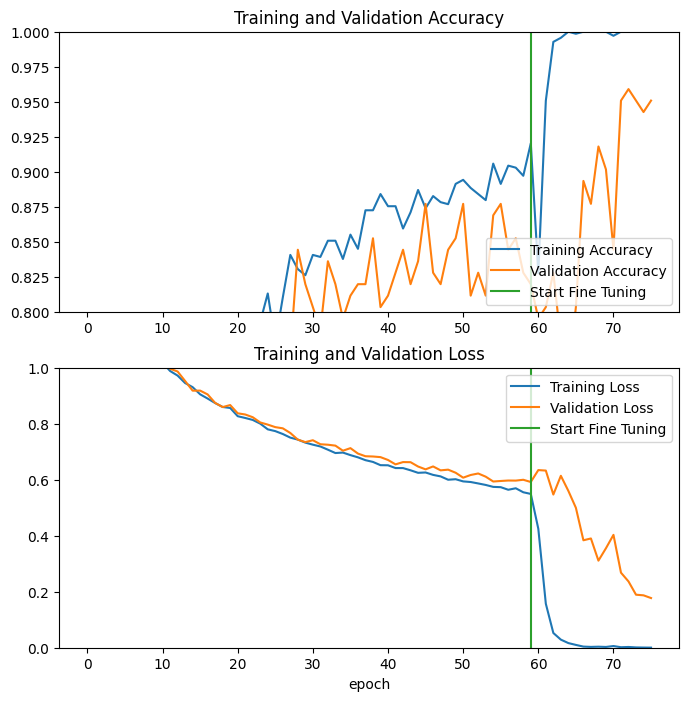

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
validation_batches

<_BatchDataset element_spec=(TensorSpec(shape=(None, 612, 612, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

# Model Analysis

In [ ]:
label2name = {0:'down2up', 1:'up2down' ,2:'right2left',3:'left2right'}

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5')

1/1 [==============================] - 3s 3s/step


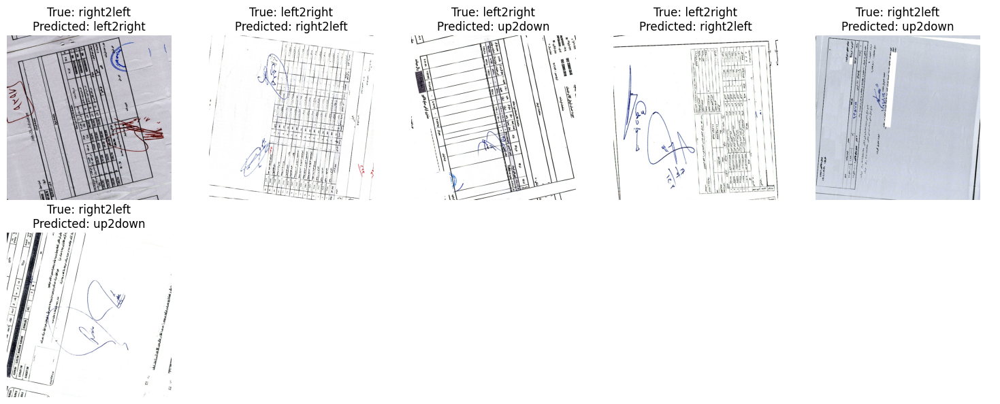

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

label2name = {0:'down2up', 1:'up2down', 2:'right2left', 3:'left2right'}

all_true_labels = []
all_predictions = []

for images, labels in validation_batches:
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    true_classes = labels.numpy()

    all_true_labels.extend(true_classes)
    all_predictions.extend(predicted_classes)

all_true_labels = np.array(all_true_labels)
all_predictions = np.array(all_predictions)

misclassified_indices = np.where(all_predictions != all_true_labels)[0]

num_images_to_display = min(10, len(misclassified_indices))

grid_rows = 2
grid_cols = 5
fig, axs = plt.subplots(grid_rows, grid_cols, figsize=(15, 6))

if num_images_to_display < 10:
    for i in range(num_images_to_display, 10):
        axs.flat[i].axis('off')

for i in range(num_images_to_display):
    index = misclassified_indices[i]

    batch_index = index // batch_size
    image_index = index % batch_size

    batch_list = list(validation_batches.as_numpy_iterator())
    misclassified_image_batch, _ = batch_list[batch_index]
    misclassified_image = misclassified_image_batch[image_index]

    ax = axs.flat[i]
    ax.imshow(misclassified_image)
    ax.set_title(f"True: {label2name[all_true_labels[index]]}\nPredicted: {label2name[all_predictions[index]]}")
    ax.axis('off')

plt.tight_layout()
plt.show()


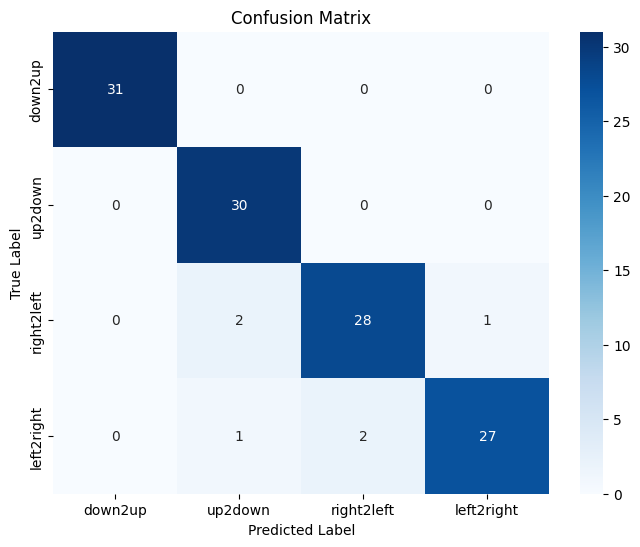

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

label2name = {0:'down2up', 1:'up2down', 2:'right2left', 3:'left2right'}


cm = confusion_matrix(all_true_labels, all_predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=[label2name[i] for i in range(len(label2name))],
            yticklabels=[label2name[i] for i in range(len(label2name))])
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()


# Infer on a Sample Image

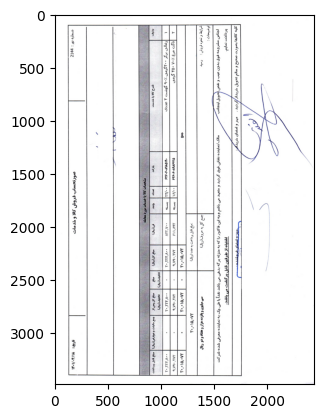

1/1 [==============================] - 1s 1s/step
Predicted Class :  right2left
Infer time :  1.0945816040039062


In [ ]:
import cv2
import matplotlib.pyplot as plt
import time
import tensorflow as tf
import numpy as np


label2name = {0:'down2up', 1:'up2down' ,2:'right2left',3:'left2right'}

img = cv2.imread('./data_34.jpg')[..., ::-1]

plt.imshow(img)
plt.show()


input_shape = (612, 612)
img_resized = cv2.resize(img, input_shape)
img_resized = img_resized.astype(np.float32)
img_resized = (img_resized/127.5) - 1
model = tf.keras.models.load_model('/content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5')
start_time = time.time()
x = model.predict(img_resized.reshape(-1, 612, 612, 3))
end_time = time.time()
print('Predicted Class : ', label2name[np.argmax(x[0])])
print('Infer time : ',end_time - start_time)


## Export Model to saved_model format for serving

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/document_processing/models/MobileNet-tune/checkpoint/best_model.h5')

In [ ]:
model.save('/content/drive/MyDrive/document_processing/models/MobileNet-tune/1' ,save_format = 'tf')

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/document_processing/models/MobileNet-tune/1')


In [ ]:
print(tf.__version__)


2.14.0
